# 꽃 이미지 분류하기

### 라이브러리 불러오기 및 마운트

In [207]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina' # 그래프의 DPI를 높여 Retina 디스플레이에서도 선명하게 표시

import numpy as np

### Step 1. 데이터셋 내려받기

In [208]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True, # 데이터를 (이미지, 레이블) 쌍으로 구성
)

In [209]:
_, metadata = tfds.load(
        'tf_flowers',
        with_info=True
    )
get_label_name = metadata.features['label'].int2str
get_label_name

<bound method ClassLabel.int2str of ClassLabel(shape=(), dtype=int64, num_classes=5)>

In [210]:
metadata.features['label'].int2str(2)

'tulips'

In [211]:
print(metadata)
print(raw_train)
print(raw_validation)
print(raw_test)

tfds.core.DatasetInfo(
    name='tf_flowers',
    full_name='tf_flowers/3.0.1',
    description="""
    A large set of images of flowers
    """,
    homepage='https://www.tensorflow.org/tutorials/load_data/images',
    data_path='C:\\Users\\user\\tensorflow_datasets\\tf_flowers\\3.0.1',
    file_format=tfrecord,
    download_size=218.21 MiB,
    dataset_size=221.83 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=5),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=3670, num_shards=2>,
    },
    citation="""@ONLINE {tfflowers,
    author = "The TensorFlow Team",
    title = "Flowers",
    month = "jan",
    year = "2019",
    url = "http://download.tensorflow.org/example_images/flower_photos.tgz" }""",
)
<PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), Te

### Step 2. 데이터 전처리

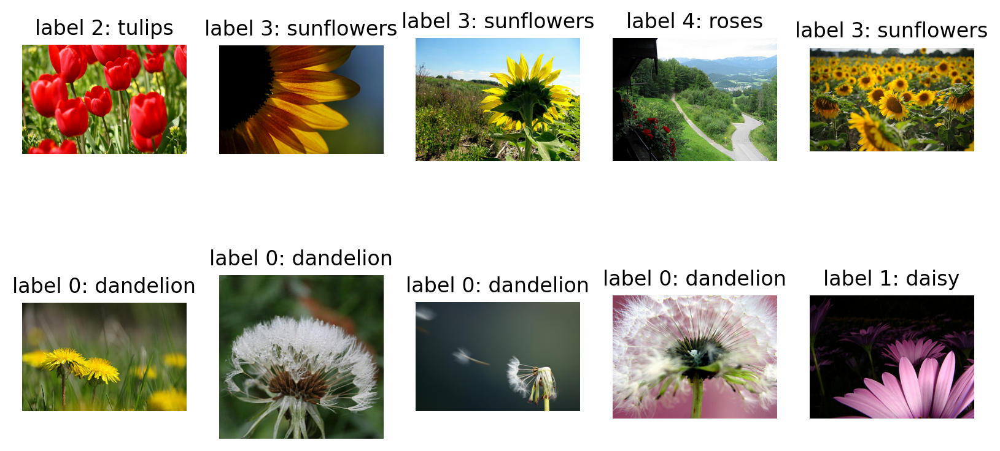

In [212]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [213]:
num_classes = metadata.features['label'].num_classes
print(f"라벨 개수: {num_classes}")

라벨 개수: 5


In [214]:
for image, label in raw_train.take(10):
  print(image.shape)

(333, 500, 3)
(212, 320, 3)
(240, 320, 3)
(240, 320, 3)
(317, 500, 3)
(212, 320, 3)
(240, 240, 3)
(333, 500, 3)
(240, 320, 3)
(240, 320, 3)


일반적인 이미지 크기인 (224,224) 로 resize

In [215]:
IMG_SIZE = 224 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = image/255 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [216]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


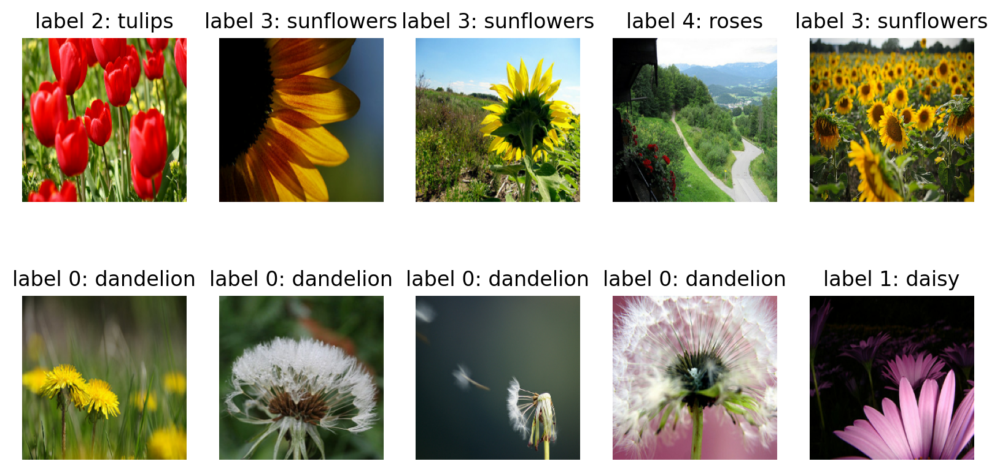

In [217]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [218]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE) # 순서에 기반한 패턴을 학습하는 것을 방지하기 위해 shuffle
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [219]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 224, 224, 3]), TensorShape([32]))

### Step 3. 모델 설계하기

In [220]:
from tensorflow.keras.applications import VGG16, VGG19, ResNet50, ResNet101, DenseNet121, MobileNetV3Large, InceptionV3, EfficientNetB0, EfficientNetB7
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Conv2D, Flatten, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import l1

In [221]:
base_model = DenseNet121(input_shape=(224,224,3),
                   include_top=False,
                   weights='imagenet')

In [222]:
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu', kernel_regularizer=l1(0.01))(x)
predictions = Dense(num_classes, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

model.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_8 (ZeroPadding2  (None, 230, 230, 3)  0          ['input_10[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d_8[0][0]']       
                                )                                                           

### Step 4. 모델 학습시키기

In [223]:
base_learning_rate = 0.0001
model.compile(
    optimizer=RMSprop(learning_rate=base_learning_rate),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [224]:
checkpoint = ModelCheckpoint("my_keras_model.keras", save_best_only=True)
early_stopping = EarlyStopping(patience=10, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', patience=3, factor=0.5, min_lr=1e-7)

In [225]:
EPOCHS = 100
with tf.device('/gpu:0'):
  history = model.fit(
      train_batches,
      epochs=EPOCHS,
      validation_data=validation_batches,
      callbacks=[checkpoint, early_stopping, lr_scheduler]
  )

Epoch 1/100
92/92 [==============================] - 96s 468ms/step - loss: 139.3254 - accuracy: 0.8668 - val_loss: 117.9540 - val_accuracy: 0.9101 - lr: 1.0000e-04
Epoch 2/100
92/92 [==============================] - 39s 414ms/step - loss: 99.1735 - accuracy: 0.9734 - val_loss: 81.2323 - val_accuracy: 0.9264 - lr: 1.0000e-04
Epoch 3/100
92/92 [==============================] - 39s 399ms/step - loss: 65.7058 - accuracy: 0.9888 - val_loss: 51.2254 - val_accuracy: 0.9510 - lr: 1.0000e-04
Epoch 4/100
92/92 [==============================] - 41s 437ms/step - loss: 39.1453 - accuracy: 0.9918 - val_loss: 28.1816 - val_accuracy: 0.9455 - lr: 1.0000e-04
Epoch 5/100
92/92 [==============================] - 43s 456ms/step - loss: 19.5879 - accuracy: 0.9928 - val_loss: 12.1985 - val_accuracy: 0.9401 - lr: 1.0000e-04
Epoch 6/100
92/92 [==============================] - 45s 484ms/step - loss: 7.1008 - accuracy: 0.9932 - val_loss: 3.2958 - val_accuracy: 0.9401 - lr: 1.0000e-04
Epoch 7/100
92/92 [===

### Step 5. 모델 성능 평가하기

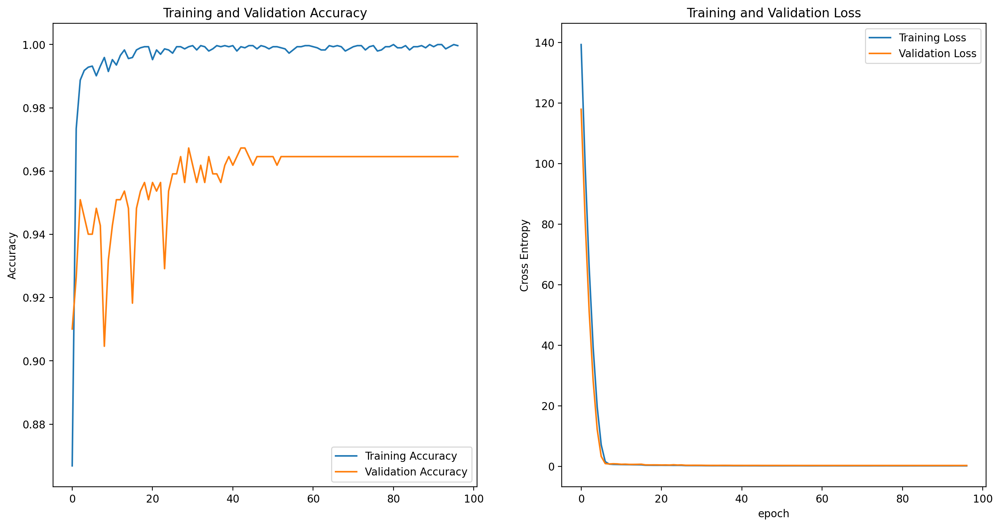

In [226]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [227]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions = np.argmax(predictions, axis=1)
predictions

1/1 [==============================] - 4s 4s/step


array([2, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 0, 3, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       2, 0, 1, 3, 1, 4, 4, 3, 0, 4], dtype=int64)

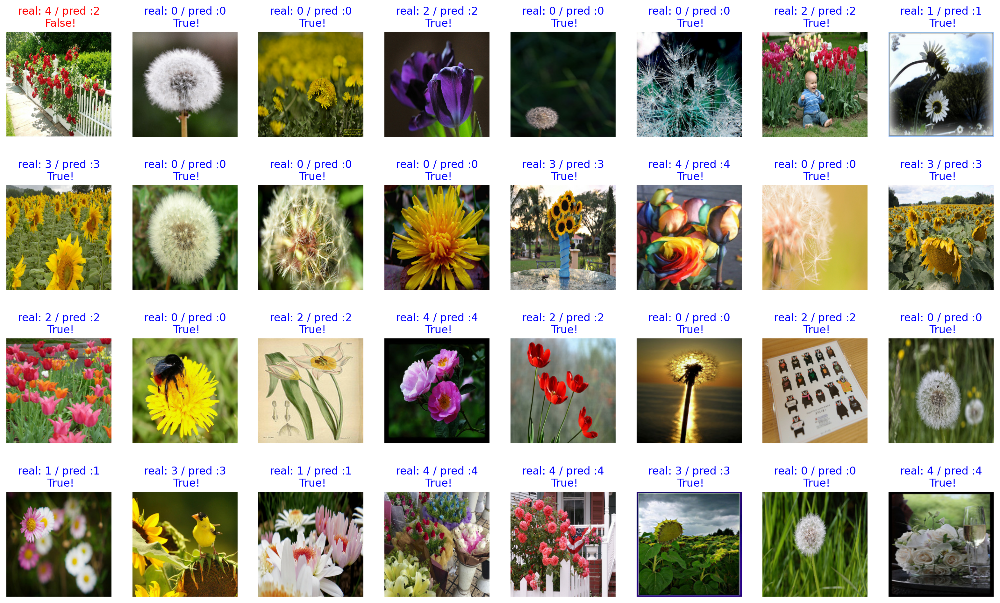

In [228]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [229]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

96.875


In [230]:
test_loss, test_accuracy = model.evaluate(test_batches)
print(f"Test Accuracy: {np.mean(test_accuracy)*100:.2f}%")

12/12 [==============================] - 2s 94ms/step - loss: 0.2319 - accuracy: 0.9755
Test Accuracy: 97.55%


### Step 6. 모델 활용하기

In [253]:
model.save('flower_densenet.pb')

INFO:tensorflow:Assets written to: flower_densenet.pb\assets


INFO:tensorflow:Assets written to: flower_densenet.pb\assets


In [247]:
load_model = tf.keras.models.load_model('flower_densenet.h5')
load_model.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_8 (ZeroPadding2  (None, 230, 230, 3)  0          ['input_10[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d_8[0][0]']       
                                )                                                           

In [ ]:
converter = tf.lite.TFLiteConverter.from_saved_model('./flower_densenet.pb')
tflite_model = converter.convert()

with open('densenet.tflite', 'wb') as f:
    f.write(tflite_model)